<a href="https://colab.research.google.com/github/Saurabh-Hase/Bike-sharing-Regression/blob/main/Copy_of_Bike_Sharing_Demand_Prediction_Capstone_Project_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


## <b> Data Description </b>

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

In [ ]:
#Importing Libraries
import pandas as pd 
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/Almabetter/Capstone Regression Bike Sharing Demand Prediction/Copy of SeoulBikeData.csv',encoding= 'unicode_escape')
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [ ]:
df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [ ]:
df.shape

(8760, 14)

# **Exploring df using pandas profiling** ▶

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.0 MB 104.8 MB/s 
     |████████████████████████████████| 102 kB 15.4 MB/s 
     |████████████████████████████████| 690 kB 65.7 MB/s 
     |████████████████████████████████| 4.7 MB 64.4 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 9.8 MB 61.2 MB/s 
     |████████████████████████████████| 296 kB 66.9 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.0-py2.py3-none-any.whl size=268032 sha256=72941ff4be4d1f81b812611081b337d9382dae48a9cd0f8b62be6eb354f19646
  Stored in directory: /tmp/pip-ephem-wheel-cache-t9gsuuls/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=57be5fadb00c65f49143ce0716c1d62076548cdafb961beb51d4c0debba48846
  Stored in directory: /root/.cache/pip/w

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
# Profiling Report
profile = ProfileReport(df, title=' Bike Sharing Demand Prediction', html={'style':{'full_width':True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file('/content/drive/MyDrive/Bike Sharing Demand Prediction.html')


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]



---



---



---



---



# **Exploring Data using Sweeetviz library**

In [ ]:
!pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 14.7 MB/s 


In [ ]:
import sweetviz 

In [ ]:
my_report = sweetviz.analyze([df, "df"],target_feat='Rented Bike Count')

                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
my_report.show_html('Report.html')

Report Report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



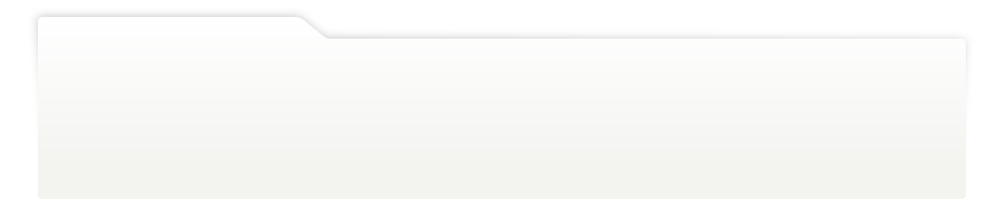
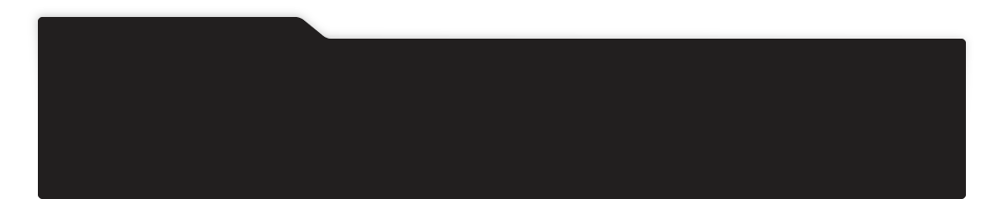
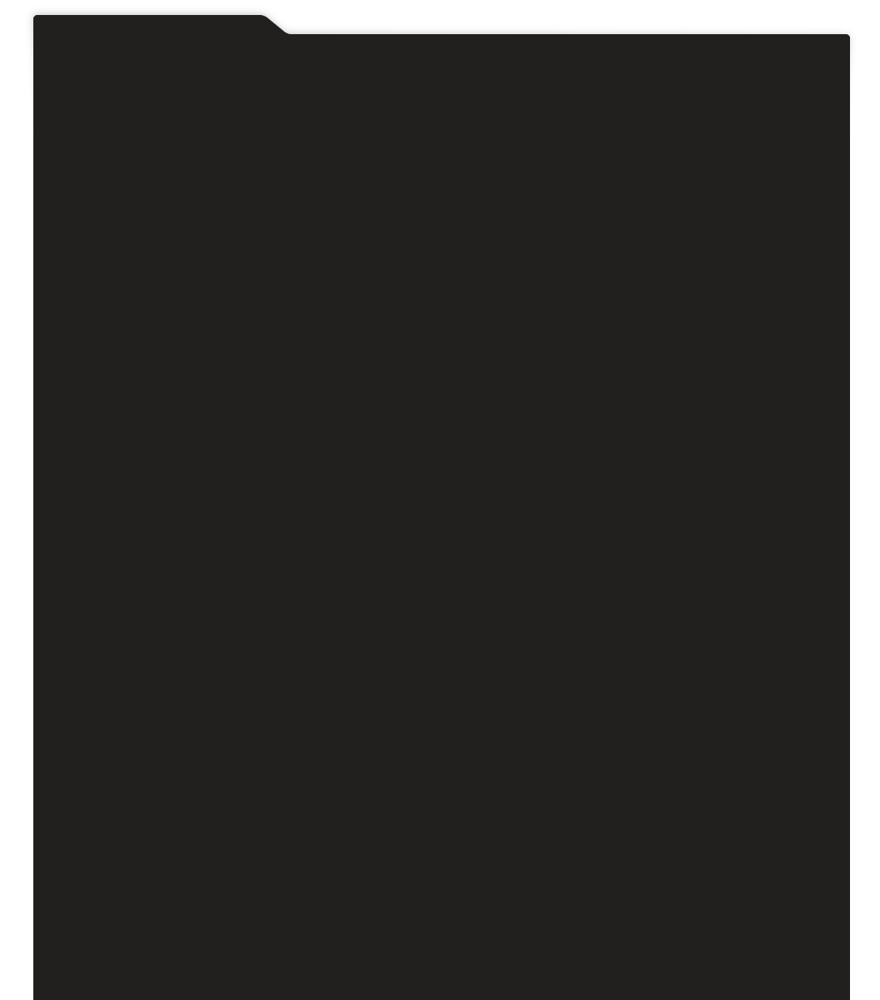
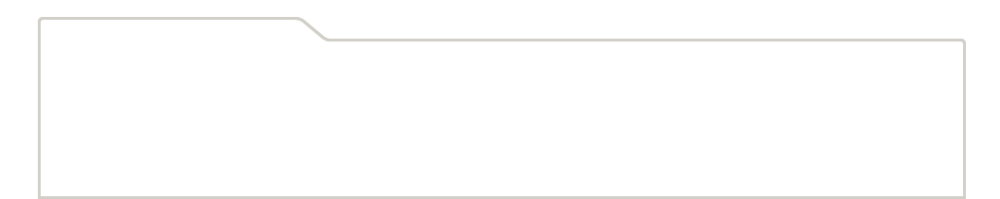
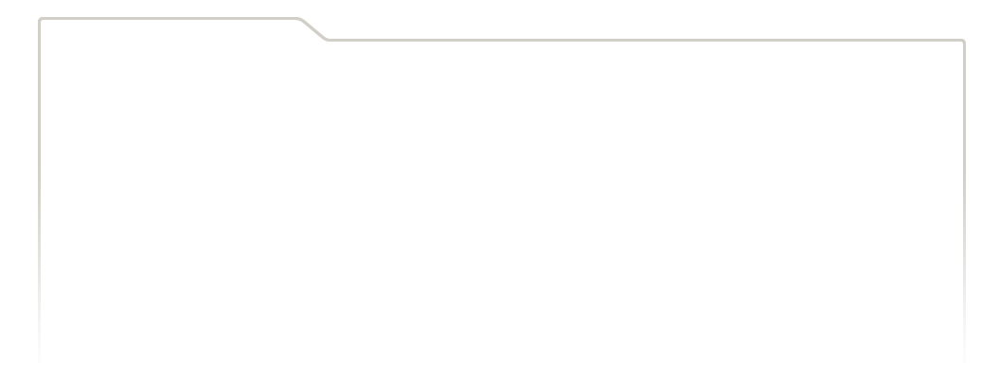
...
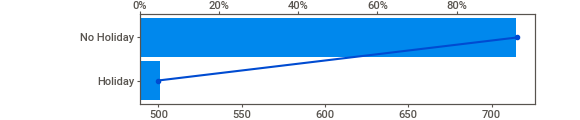
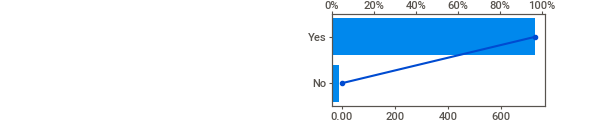
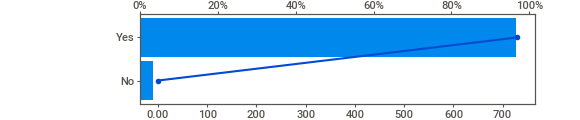
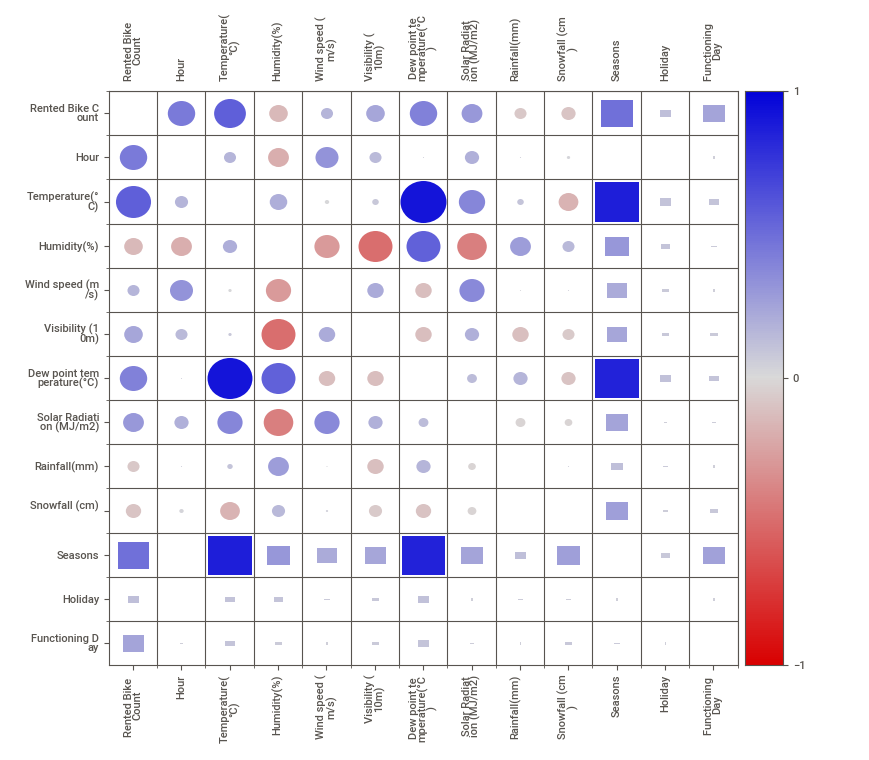
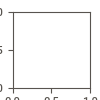

In [ ]:
import IPython
IPython.display.HTML('Report.html')



---



---



---



# EDA continue

In [ ]:
# Checking null values
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#Expanding date variable

In [ ]:
#Making New columns
df['date_column'] = pd.to_datetime(df['Date'])

In [ ]:
df['Dates'] = df['date_column'].dt.date

In [ ]:
df['Month'] = pd.DatetimeIndex(df['date_column']).month

In [ ]:
df['Year'] = pd.DatetimeIndex(df['date_column']).year

In [ ]:
df['day'] = df.date_column.dt.day

In [ ]:
df['weekday']=df.date_column.dt.weekday

In [ ]:
df['weekday'].unique()

array([3, 6, 2, 4, 0, 5, 1])

In [ ]:
df['day_of_week'] = df['date_column'].dt.day_name()

In [ ]:
df.head(1)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),...,Seasons,Holiday,Functioning Day,date_column,Dates,Month,Year,day,weekday,day_of_week
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,Winter,No Holiday,Yes,2017-01-12,2017-01-12,1,2017,12,3,Thursday


In [ ]:
df= df.drop(['Date','Dates','date_column','weekday'], axis=1)

In [ ]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


# **Checking outliers**

In [ ]:
import seaborn as sns

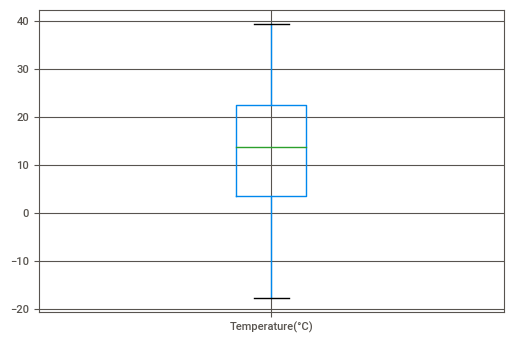

In [ ]:
df.boxplot(column=['Temperature(°C)',])

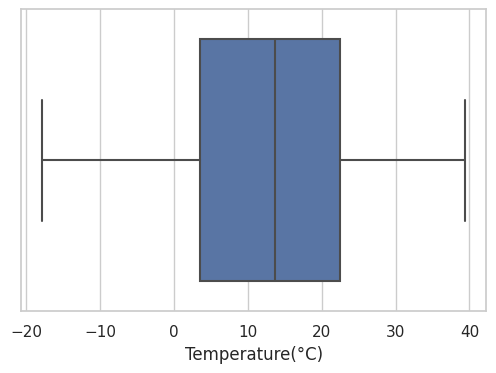

In [ ]:

sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Temperature(°C)"])


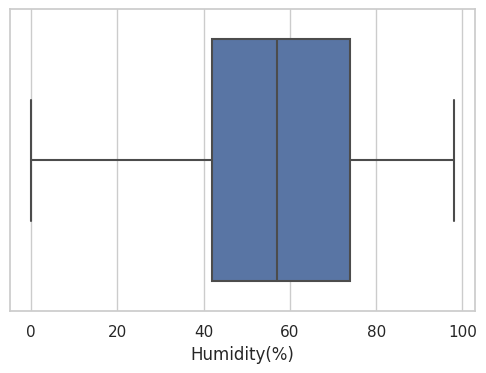

In [ ]:
ax = sns.boxplot(x=df["Humidity(%)"])

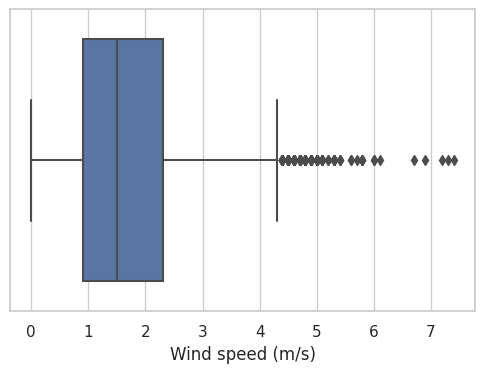

In [ ]:
ax = sns.boxplot(x=df["Wind speed (m/s)"])

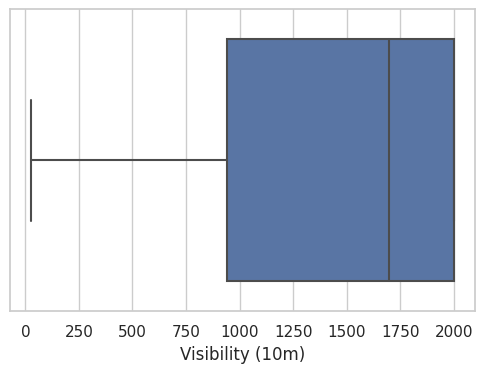

In [ ]:
ax = sns.boxplot(x=df["Visibility (10m)"])

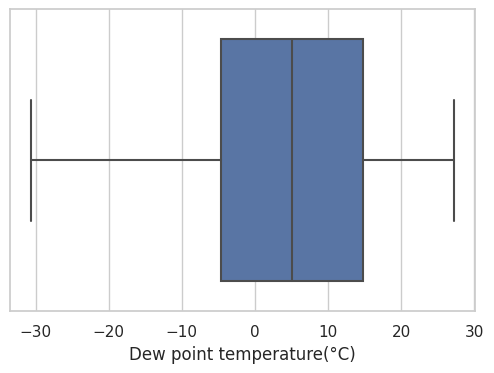

In [ ]:
ax = sns.boxplot(x=df["Dew point temperature(°C)"])

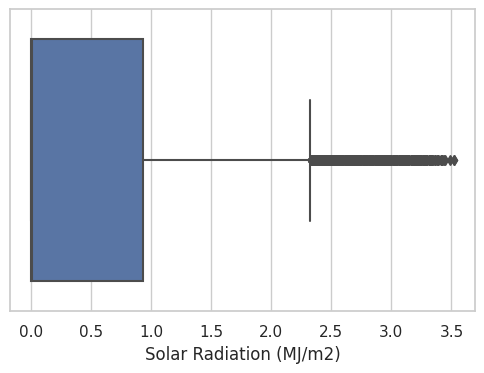

In [ ]:
ax = sns.boxplot(x=df["Solar Radiation (MJ/m2)"])	

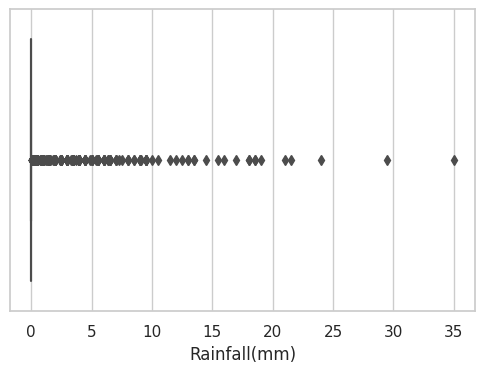

In [ ]:
ax= sns.boxplot(x=df["Rainfall(mm)"])	

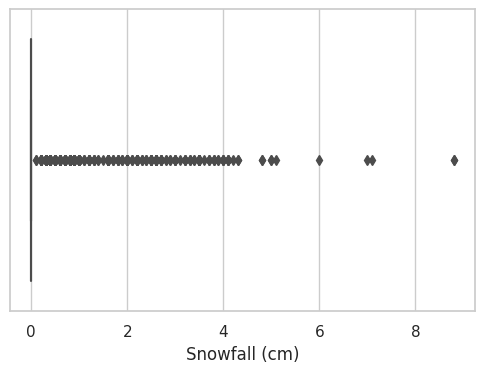

In [ ]:
ax=sns.boxplot(x=df["Snowfall (cm)"])	

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


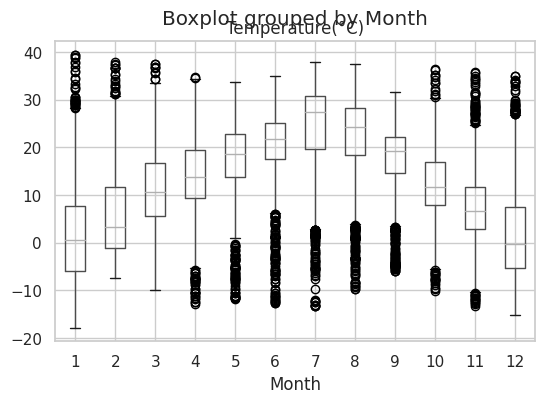

In [ ]:
df.boxplot(column='Temperature(°C)',by='Month')

it looklikes there is no outlier in this dataset


---



---

\

# **Normalising data**

In [ ]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [ ]:
numeric_features = df.describe().columns
numeric_features

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

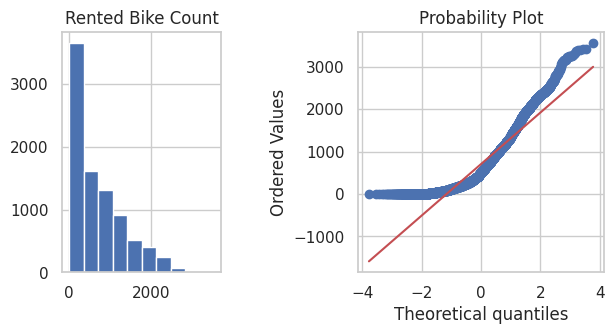

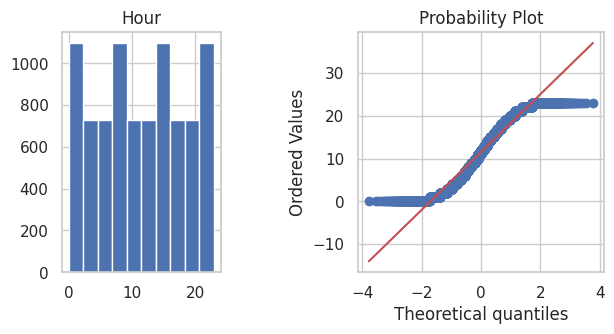

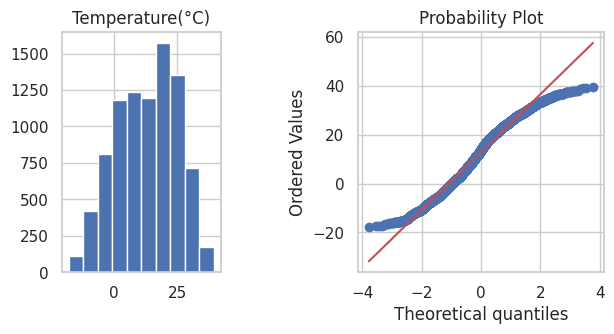

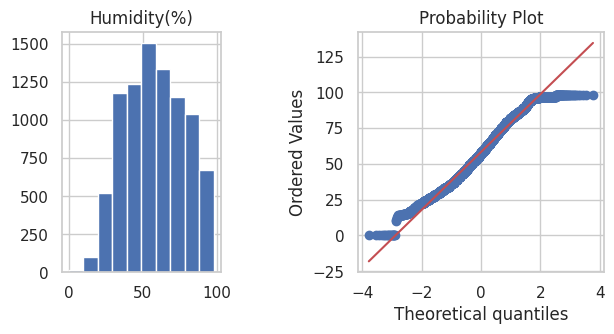

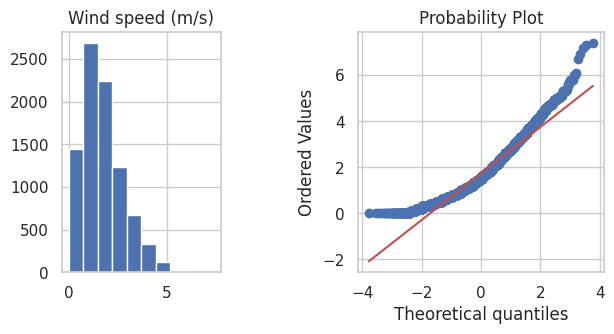

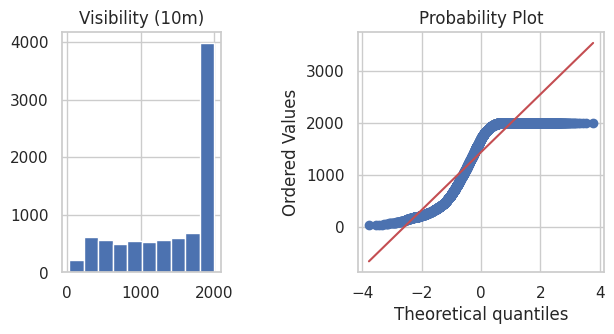

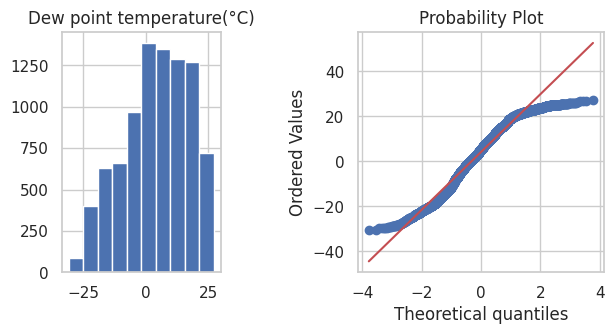

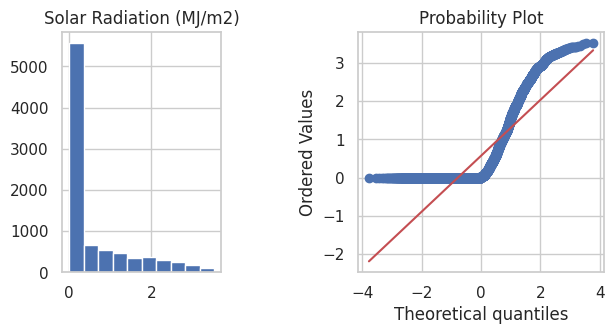

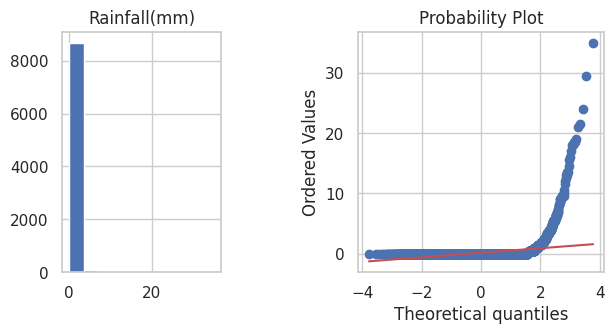

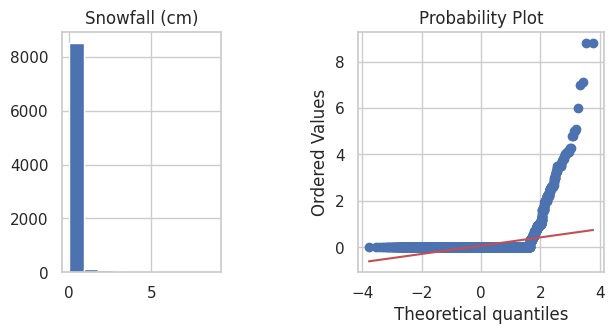

In [ ]:
# checking distribution and data is skewed or not
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable(df,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  df[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(df[variable],dist='norm',plot=plt)
  plt.show()

for col in numeric_features[0:10]:
  plotvariable(df,col)
  


# Log Transformation

In [ ]:
df_log=df.copy()

In [ ]:
df_log.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [ ]:
numeric_features_log = df_log.describe().columns
numeric_features_log

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

In [ ]:
#addig small value to remove negative values
for col in numeric_features_log:
  df_log[col]=df_log[col]+.01

In [ ]:
df_log.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254.01,0.01,-5.19,37.01,2.21,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
1,204.01,1.01,-5.49,38.01,0.81,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
2,173.01,2.01,-5.99,39.01,1.01,2000.01,-17.69,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
3,107.01,3.01,-6.19,40.01,0.91,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
4,78.01,4.01,-5.99,36.01,2.31,2000.01,-18.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday


In [ ]:
df_log.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month,Year,day
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.612055,11.510000,12.892922,58.236256,1.734909,1436.835799,4.083813,0.579111,0.158687,0.085068,6.536027,2017.925068,15.730548
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048,0.278796,8.796749
min,0.010000,0.010000,-17.790000,0.010000,0.010000,27.010000,-30.590000,0.010000,0.010000,0.010000,1.010000,2017.010000,1.010000
25%,191.010000,5.760000,3.510000,42.010000,0.910000,940.010000,-4.690000,0.010000,0.010000,0.010000,4.010000,2018.010000,8.010000
50%,504.510000,11.510000,13.710000,57.010000,1.510000,1698.010000,5.110000,0.020000,0.010000,0.010000,7.010000,2018.010000,16.010000
75%,1065.260000,17.260000,22.510000,74.010000,2.310000,2000.010000,14.810000,0.940000,0.010000,0.010000,10.010000,2018.010000,23.010000
max,3556.010000,23.010000,39.410000,98.010000,7.410000,2000.010000,27.210000,3.530000,35.010000,8.810000,12.010000,2018.010000,31.010000


In [ ]:
df_log['Rented Bike Count'].describe()

count    8760.000000
mean      704.612055
std       644.997468
min         0.010000
25%       191.010000
50%       504.510000
75%      1065.260000
max      3556.010000
Name: Rented Bike Count, dtype: float64

In [ ]:
#Log Transformation
df_log['Rented Bike Count']=np.log(df_log['Rented Bike Count'])

In [ ]:
df_log.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month,Year,day
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,5.727180,11.510000,12.892922,58.236256,1.734909,1436.835799,4.083813,0.579111,0.158687,0.085068,6.536027,2017.925068,15.730548
std,2.242278,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048,0.278796,8.796749
min,-4.605170,0.010000,-17.790000,0.010000,0.010000,27.010000,-30.590000,0.010000,0.010000,0.010000,1.010000,2017.010000,1.010000
25%,5.252326,5.760000,3.510000,42.010000,0.910000,940.010000,-4.690000,0.010000,0.010000,0.010000,4.010000,2018.010000,8.010000
50%,6.223587,11.510000,13.710000,57.010000,1.510000,1698.010000,5.110000,0.020000,0.010000,0.010000,7.010000,2018.010000,16.010000
75%,6.970974,17.260000,22.510000,74.010000,2.310000,2000.010000,14.810000,0.940000,0.010000,0.010000,10.010000,2018.010000,23.010000
max,8.176394,23.010000,39.410000,98.010000,7.410000,2000.010000,27.210000,3.530000,35.010000,8.810000,12.010000,2018.010000,31.010000


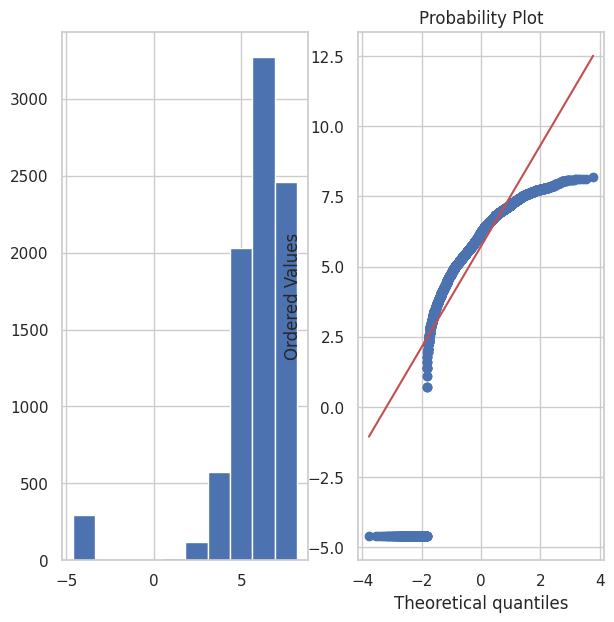

In [ ]:

import scipy.stats as stats
def plotlog(df, variable):
  plt.figure(figsize=(7,7))
  plt.subplot(1,2,1)  #means in sub plot 1 row , 2 cloumn and first plot
  df_log[variable].hist(bins=10)

  ## Q-Q plot
  plt.subplot(1,2,2)
  stats.probplot(df[variable],dist='norm',plot=plt)
  plt.show()


plotlog(df_log,'Rented Bike Count')
  

# Applying YEO-JOHANSON transformation

In [ ]:
df_yeo_johanson=df.copy()

In [ ]:
numeric_features_yeo_johanson = df_yeo_johanson.describe().columns
numeric_features_yeo_johanson

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

In [ ]:
for col in numeric_features_yeo_johanson:
  df_yeo_johanson[col]=df_yeo_johanson[col]+.01

In [ ]:
numeric_feature_df=df[['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]
from sklearn.preprocessing import PowerTransformer
from pandas import DataFrame
power = PowerTransformer(method='yeo-johnson', standardize=True)
data_trans = power.fit_transform(numeric_feature_df)
data_trans=DataFrame(data_trans)

data_trans.rename(columns={0:'Rented Bike Count', 1:'Hour', 2:'Temperature(°C)',3: 'Humidity(%)',
       4:'Wind speed (m/s)', 5:'Visibility (10m)', 6:'Dew point temperature(°C)',
       7:'Solar Radiation (MJ/m2)', 8:'Rainfall(mm)', 9:'Snowfall (cm)'},inplace=True)
data_trans.head(2)



,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-1.556854,-0.845761,-0.252859,-0.230785
1,-0.676497,-1.654871,-1.550870,-0.986482,-0.923651,0.978214,-1.556854,-0.845761,-0.252859,-0.230785


In [ ]:
data_trans.shape

(8760, 10)

In [ ]:
data_trans.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03
mean,-5.101956e-16,4.785619e-17,-6.488975e-17,1.622244e-18,-3.114708e-16,-4.866731e-17,-8.435667e-17,9.084565e-17,6.488975e-17,-1.297795e-17
std,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00
min,-2.237130e+00,-1.902967e+00,-2.640013e+00,-3.323576e+00,-2.512538e+00,-1.906656e+00,-2.351050e+00,-8.457613e-01,-2.528588e-01,-2.307853e-01
25%,-7.183346e-01,-7.667177e-01,-7.748272e-01,-7.793079e-01,-7.782032e-01,-9.266806e-01,-7.314501e-01,-8.457613e-01,-2.528588e-01,-2.307853e-01
50%,8.901544e-03,8.758295e-02,7.641456e-02,-2.896424e-02,-4.175238e-02,3.768216e-01,1.364596e-04,-7.927406e-01,-2.528588e-01,-2.307853e-01
75%,7.639707e-01,8.360358e-01,8.040896e-01,7.823837e-01,7.001838e-01,9.782138e-01,8.289624e-01,1.115979e+00,-2.528588e-01,-2.307853e-01
max,2.485780e+00,1.521129e+00,2.192585e+00,1.876751e+00,3.174364e+00,9.782138e-01,1.935283e+00,1.699041e+00,4.021693e+00,4.337315e+00


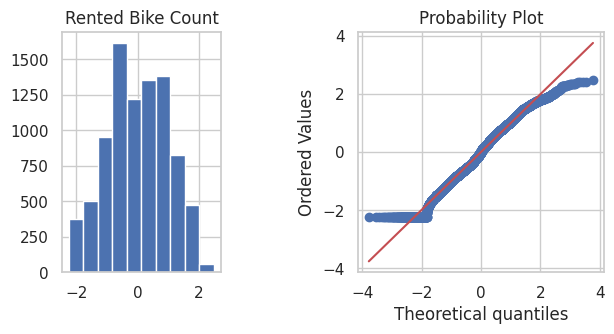

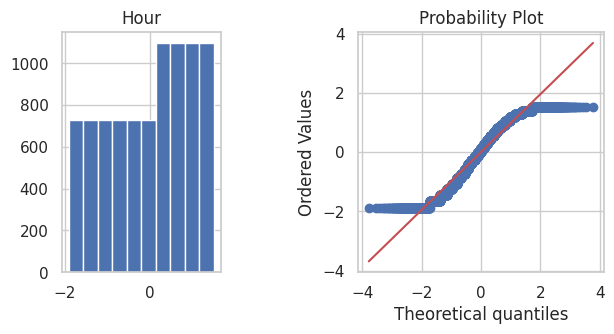

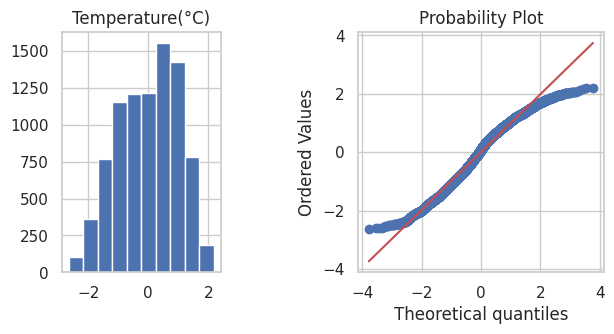

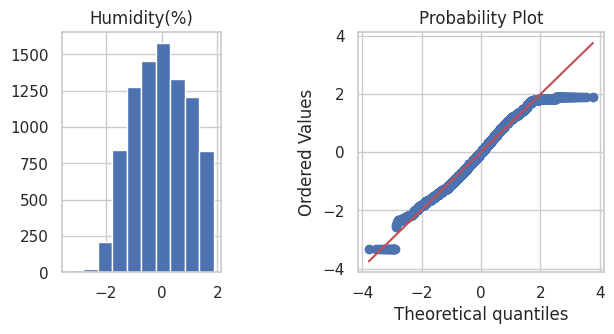

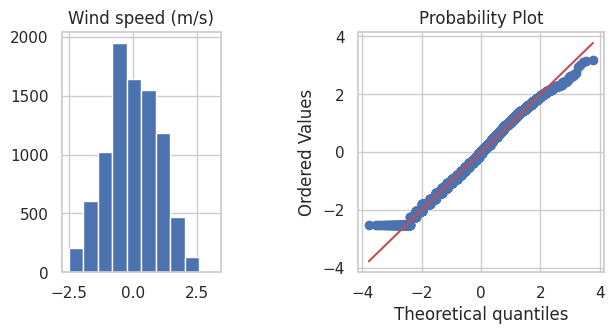

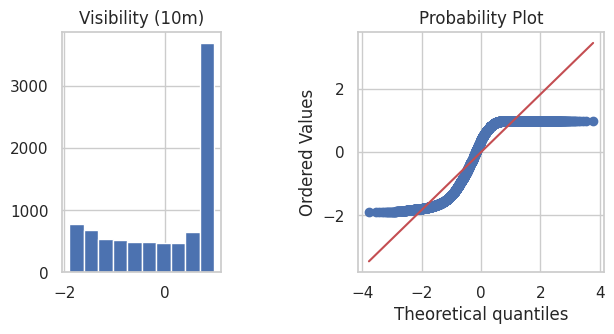

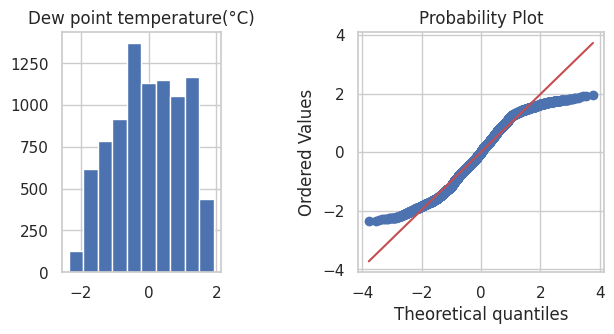

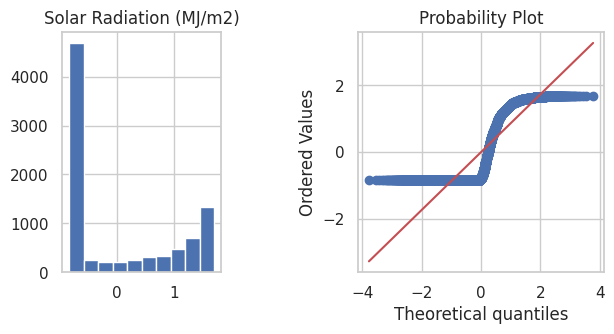

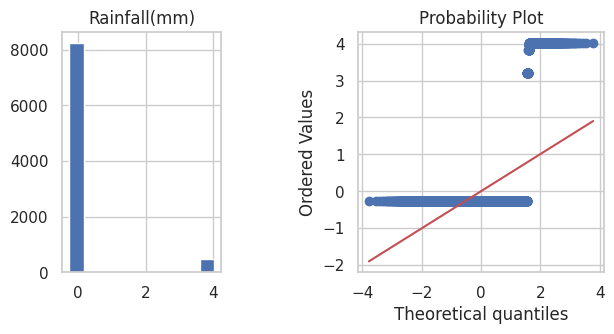

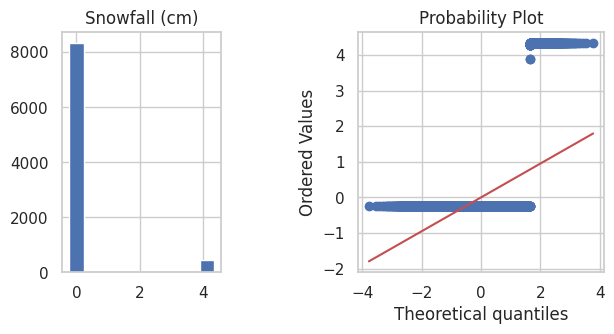

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable_box_cox(data_trans,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  data_trans[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(data_trans[variable],dist='norm',plot=plt)
  plt.show()

for col in data_trans[0:10]:
  plotvariable_box_cox(data_trans,col)
  

In [ ]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [ ]:
catagorical_df=df[['Seasons','day_of_week','Holiday','Functioning Day']]


df_yj = pd.concat([data_trans, catagorical_df], axis=1)
df_yj.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,day_of_week,Holiday,Functioning Day
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
1,-0.676497,-1.654871,-1.550870,-0.986482,-0.923651,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
2,-0.779424,-1.440263,-1.594819,-0.934363,-0.640327,0.978214,-1.563069,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
3,-1.047379,-1.244866,-1.612409,-0.882465,-0.778203,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
4,-1.200315,-1.062616,-1.594819,-1.091410,0.700184,0.978214,-1.618915,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes


# **Checking distribution with Dependent Variable**



---



---



---



---



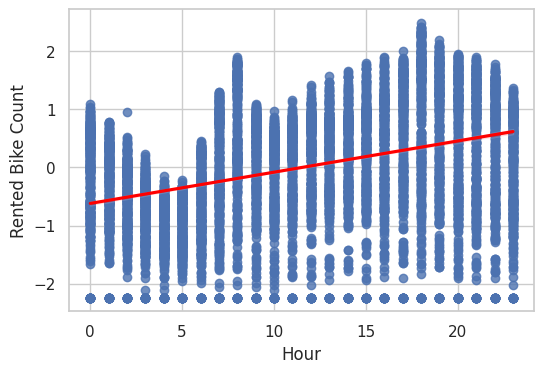

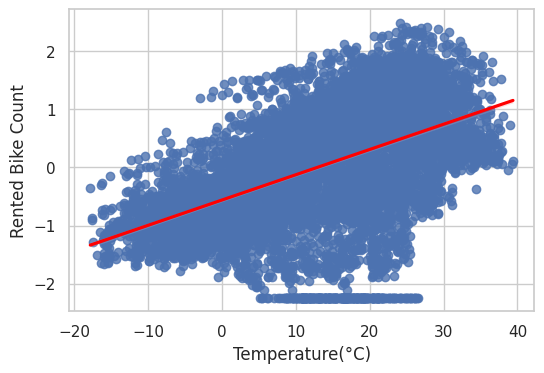

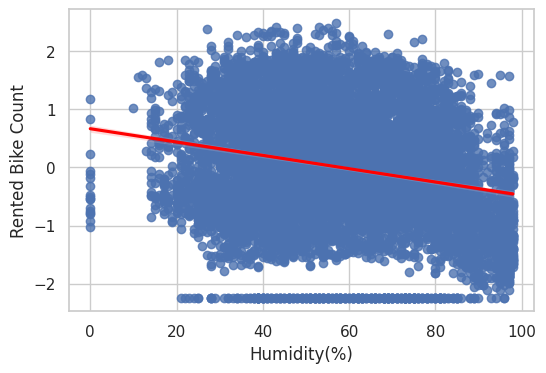

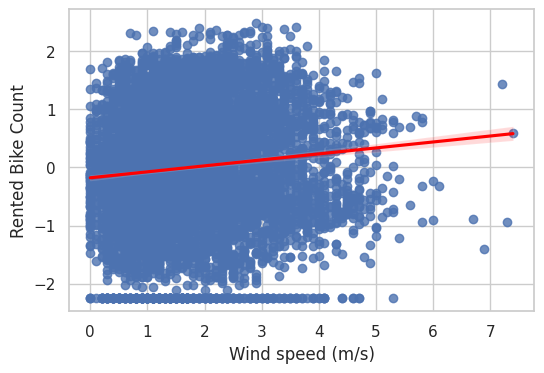

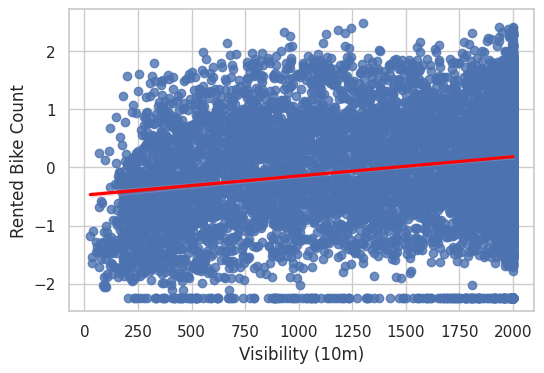

...

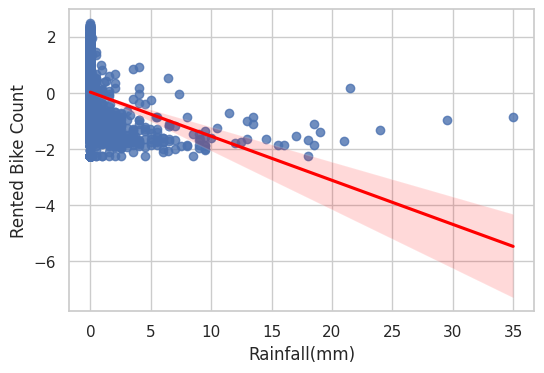

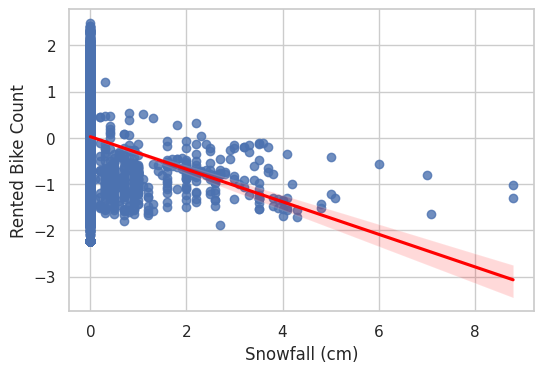

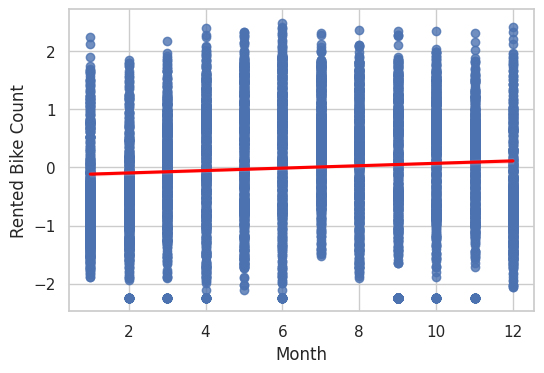

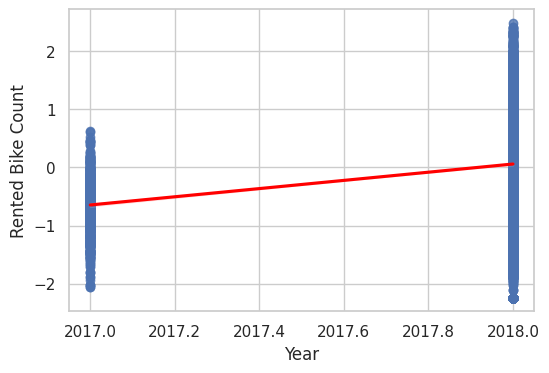

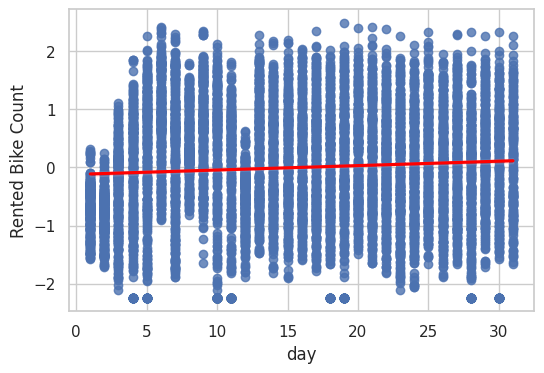

In [ ]:
#Plotting scatter plot to check distribution
for col in numeric_features[:]:
  if col == 'Rented Bike Count':
    pass
  else:
    sns.regplot(x=df[col],y=df_yj["Rented Bike Count"],line_kws={"color": "red"})
  
  plt.show()



```
# This is formatted as code
```

# **Checking correlation of variable**

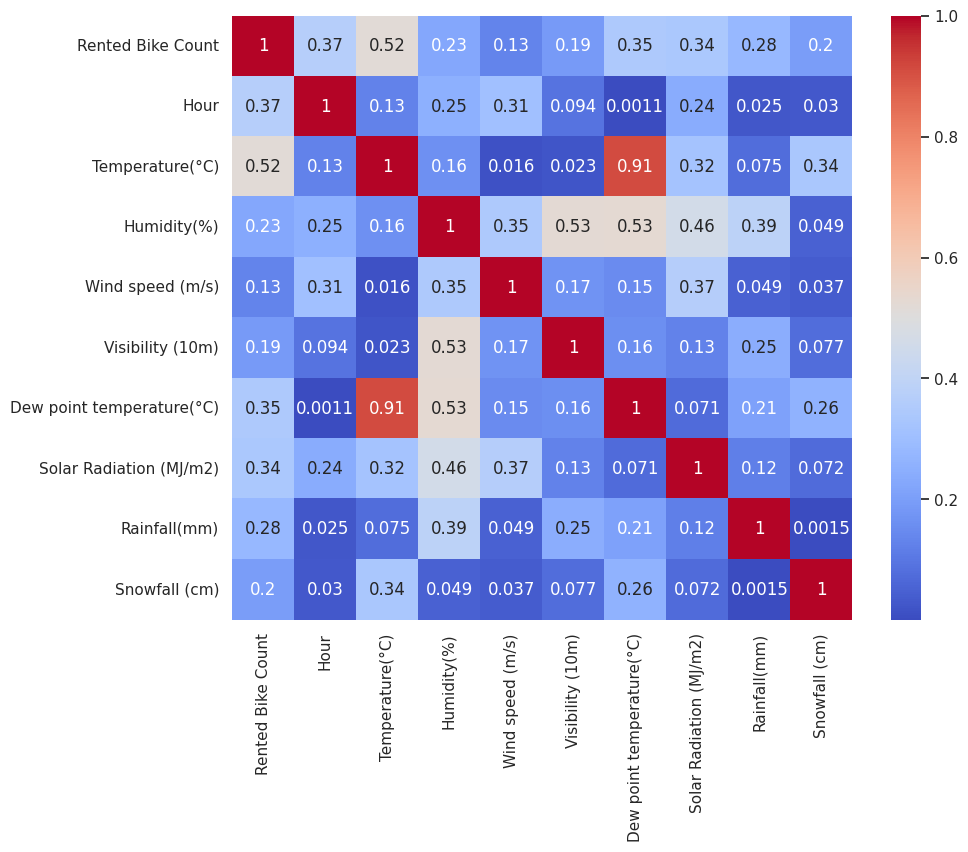

In [ ]:
#Correlation
plt.figure(figsize=(10,8))
correlation = df_yj.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
 
   # Calculating VIF
   vif = pd.DataFrame()
   vif["variables"] = X.columns
   vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
 
   return(vif)

In [ ]:
calc_vif(df_yj[[i for i in df_yj.describe().columns if i not in ['Rented Bike Count'] ]])

,variables,VIF
0,Hour,1.182670
1,Temperature(°C),46.026911
2,Humidity(%),12.034723
3,Wind speed (m/s),1.298162
4,Visibility (10m),1.564782
5,Dew point temperature(°C),60.387097
6,Solar Radiation (MJ/m2),1.858436
7,Rainfall(mm),1.198914
8,Snowfall (cm),1.168005


In [ ]:
df_without_dewpoint=df_yj.drop(['Dew point temperature(°C)'],axis=1)

In [ ]:
df_without_dewpoint.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,day_of_week,Holiday,Functioning Day
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes


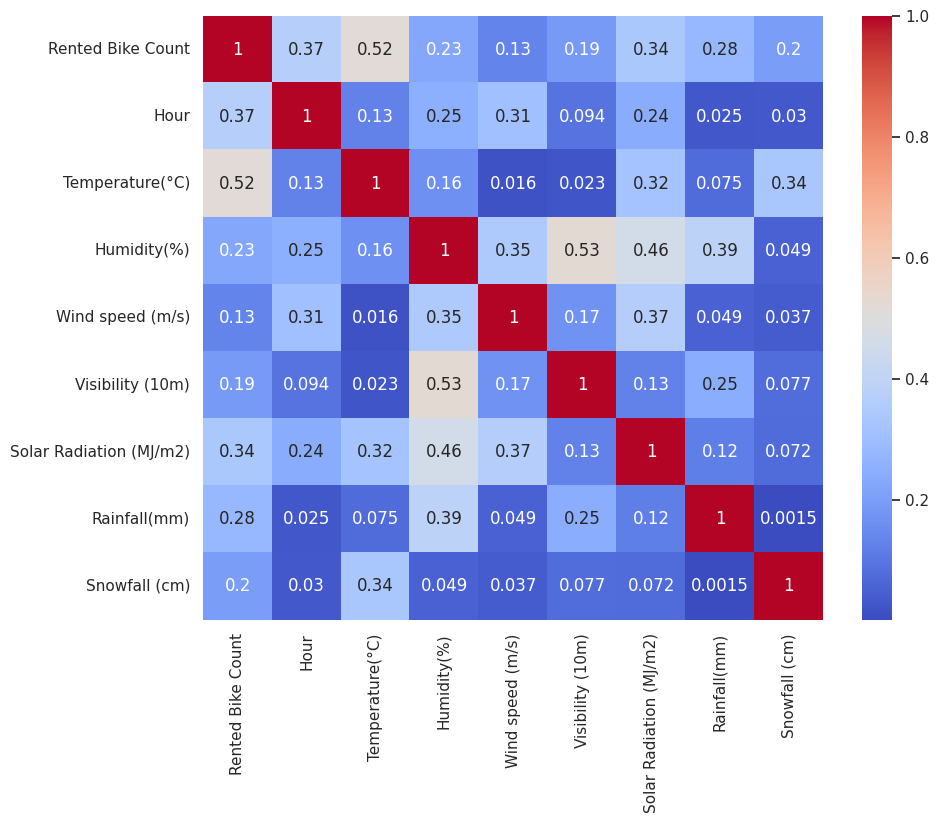

In [ ]:
#checking correlation after droping column
plt.figure(figsize=(10,8))
correlation = df_without_dewpoint.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [ ]:
calc_vif(df_yj[[i for i in df_without_dewpoint.describe().columns if i not in ['Rented Bike Count'] ]])

,variables,VIF
0,Hour,1.180457
1,Temperature(°C),1.602807
2,Humidity(%),2.523959
3,Wind speed (m/s),1.297669
4,Visibility (10m),1.502836
5,Solar Radiation (MJ/m2),1.827327
6,Rainfall(mm),1.198674
7,Snowfall (cm),1.163389


# **One hot encoding for catogorical variable**

In [ ]:
#One hot encoding

In [ ]:
one_hot_encoded_data = pd.get_dummies(df_yj, columns = ['Seasons','day_of_week','Holiday','Functioning Day'])

pd.set_option('display.max_columns', None)
one_hot_encoded_data.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Autumn,Seasons_Spring,Seasons_Summer,Seasons_Winter,day_of_week_Friday,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday,Holiday_Holiday,Holiday_No Holiday,Functioning Day_No,Functioning Day_Yes
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1
1,-0.676497,-1.654871,-1.550870,-0.986482,-0.923651,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1
2,-0.779424,-1.440263,-1.594819,-0.934363,-0.640327,0.978214,-1.563069,-0.845761,-0.252859,-0.230785,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1
3,-1.047379,-1.244866,-1.612409,-0.882465,-0.778203,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1
4,-1.200315,-1.062616,-1.594819,-1.091410,0.700184,0.978214,-1.618915,-0.845761,-0.252859,-0.230785,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1


# **Linear regression**

In [ ]:
#creating list of matrix to store the evaluation matrix of all model
mean_sq_error=[]
root_mean_sq_error=[]
r2_list=[]
adj_r2_list=[]

In [ ]:
# making a function to train and evaluate linear model
def train_linear_model (model,X_train,y_train,X_test,y_test):

#training the model
  model.fit(X_train,y_train)

  #predicting the values
  pred = model.predict(X_test)
  import math
  from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

  print('\n================Evalution Matrix=========================\n')

  #finding mean_squared_error
  MSE  = mean_squared_error(y_test**2,pred**2)
  print("MSE :" , MSE)

  #finding root mean squared error
  RMSE = np.sqrt(MSE)
  print("RMSE :" ,RMSE)

  #finding the r2 score
  r2 = r2_score(y_test**2,pred**2)
  print("R2 :" ,r2)
  #finding the adjusted r2 score
  adj_r2=1-(1-r2_score(y_test**2,pred**2))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
  print("Adjusted R2 : ",adj_r2)

  print('\n================Evalution Matrix=========================\n')
  

#appending metrice to list
  mean_sq_error.append(MSE)
  root_mean_sq_error.append(RMSE)
  r2_list.append(r2)
  adj_r2_list.append(adj_r2)
    
  # ploting the line graph of actual and predicted values
  print('\
  =========================================================\
  Evalution Graph\
  ===================================================\n')  
  plt.figure(figsize=(10,7))
  plt.plot((pred)[:100])
  plt.plot((np.array(y_test)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.show()

In [ ]:
X = one_hot_encoded_data.drop(['Rented Bike Count'], axis=1)

In [ ]:
X.shape

(8760, 24)

In [ ]:
y=one_hot_encoded_data['Rented Bike Count']

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

In [ ]:
#splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
#Applyin model
from sklearn.linear_model import LinearRegression
linear_model= LinearRegression()


================Evalution Matrix=========================

MSE : 1.076126943011156
RMSE : 1.0373653854891998
R2 : 0.2705943519735111
Adjusted R2 :  0.26045785194303306

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



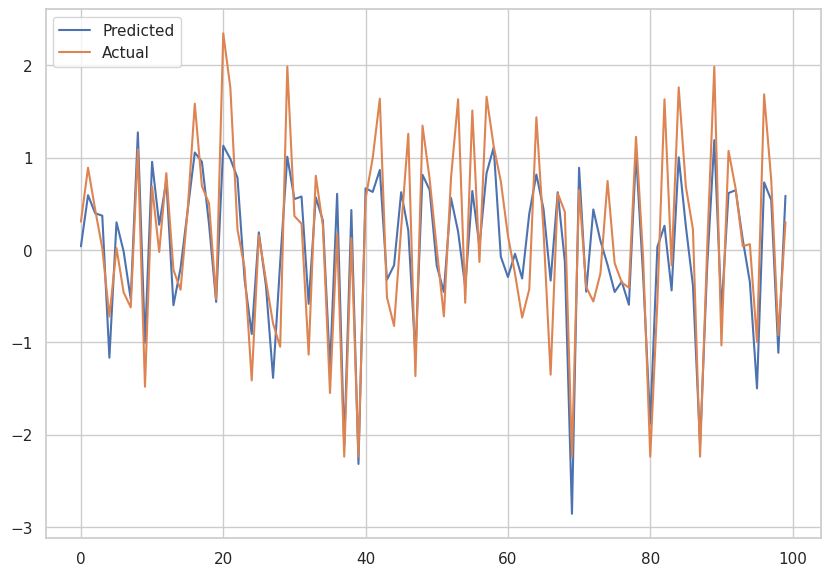

In [ ]:
#Evaluating Model
train_linear_model(linear_model, X_train, y_train, X_test, y_test)

# Residual analysis

In [ ]:
# Fitting linear model
linear_model_= LinearRegression()
linear_model_.fit(X_train,y_train)

y_pred_train = linear_model_.predict(X_train)
y_pred_test= linear_model_.predict(X_test)

In [ ]:
# Y prediction for training data
y_pred_train_df = pd.DataFrame(y_pred_train)
y_pred_train_df.head()

,0
0,-2.17
1,0.88
2,-0.18
3,-0.16
4,0.73


In [ ]:
# Actual Y for training dataset
y_train_df = pd.DataFrame(y_train)
y_train_df.head()

,Rented Bike Count
54,-1.80
5748,0.22
8382,-0.28
4228,-0.59
7437,1.37


In [ ]:
# Residual error  of training Dataset (Actual-Preducted)
train_residual_df = pd.DataFrame(y_train-y_pred_train)
train_residual_df.head()

,Rented Bike Count
54,0.37
5748,-0.66
8382,-0.10
4228,-0.43
7437,0.64


In [ ]:
# Residual plot for training data
import plotly.express as px
fig = px.scatter(train_residual_df)
fig.add_hline(y=0)
fig.show()


**From above plot we can say our residual errors have constant variance and they havethe homoscadacity in between** **them**

Residual analysis for test data

In [ ]:
# Y prediction for testing data
y_pred_test_df = pd.DataFrame(y_pred_test)
y_pred_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1752 entries, 0 to 1751
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1752 non-null   float64
dtypes: float64(1)
memory usage: 13.8 KB


In [ ]:
# Actual Y for testing dataset
y_test_df = pd.DataFrame(y_test)
y_test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1752 entries, 4136 to 7777
Data columns (total 1 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Rented Bike Count  1752 non-null   float64
dtypes: float64(1)
memory usage: 27.4 KB


In [ ]:
# Residual error  of testing Dataset (Actual-Preducted)
test_residual_df = pd.DataFrame(y_test-y_pred_test)
test_residual_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1752 entries, 4136 to 7777
Data columns (total 1 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Rented Bike Count  1752 non-null   float64
dtypes: float64(1)
memory usage: 27.4 KB


In [ ]:
# Residual plot for testing data
import plotly.express as px
fig = px.scatter(test_residual_df)
fig.add_hline(y=0)
fig.show()


**From above plot we can say our residual errors have constant variance and they havethe homoscadacity in between them**

# lasso regression

In [ ]:
from sklearn.linear_model import Lasso

In [ ]:
# finding the best parameters for lasso by gridsearchcv
from sklearn.model_selection import GridSearchCV
lasso_model = Lasso()
#setting the parameters of the lasso model
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]}
lasso_grid = GridSearchCV(lasso_model, parameters, scoring='neg_mean_squared_error', cv=5)

In [ ]:
lasso_grid


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 0.1, 1, 5, 10, 20, 30, 40, 45,
                                   50, 55, 60, 100, 0.0014]},
             scoring='neg_mean_squared_error')

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.090e+02, tolerance: 5.674e-01
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.031e+02, tolerance: 5.540e-01
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa


================Evalution Matrix=========================

MSE : 1.0757081296209068
RMSE : 1.0371635018746594
R2 : 0.2708782263382419
Adjusted R2 :  0.26074567129024995

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



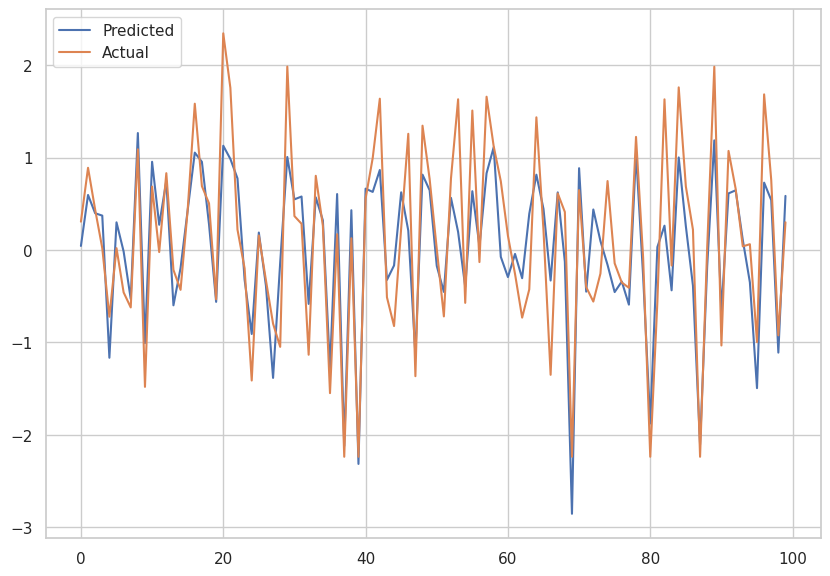

In [ ]:
# calling train_linear_model to train,fit and evalution of lasso model
train_linear_model(lasso_grid,X_train,y_train,X_test,y_test)

# Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge
ridge = Ridge()

# finding the best parameters for ridge model by gridsearchcv

parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,60,100,0.5,1.5,1.6,1.7,1.8,1.9]}
ridge_grid = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=3)


================Evalution Matrix=========================

MSE : 1.0750024132133889
RMSE : 1.036823231420568
R2 : 0.2713565653826191
Adjusted R2 :  0.2612306577793666

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



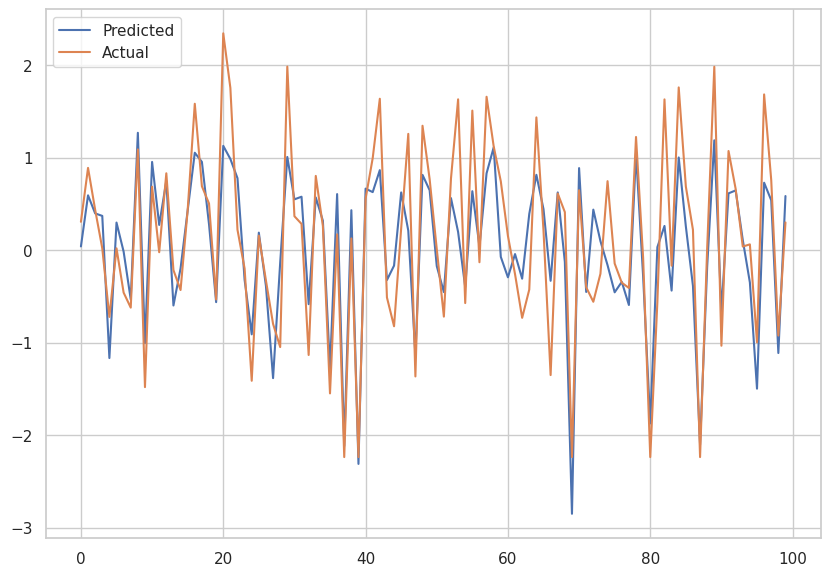

In [ ]:
# calling train_linear_model to train,fit and evalution of ridge model

train_linear_model(ridge_grid,X_train,y_train,X_test,y_test)


# ElasticNet Regression

In [ ]:
from sklearn.linear_model import ElasticNet
elastic = ElasticNet()

# finding the best parameters for ridge model by gridsearchcv

parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100],'l1_ratio':[0.1,0.2,0.3,0.4,0.5]}
elastic_grid = GridSearchCV(elastic, parameters, scoring='neg_mean_squared_error',cv=5)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.090e+02, tolerance: 5.674e-01
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.031e+02, tolerance: 5.540e-01
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa


================Evalution Matrix=========================

MSE : 1.0755311517134152
RMSE : 1.0370781801356228
R2 : 0.2709981830832511
Adjusted R2 :  0.2608672950658788

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



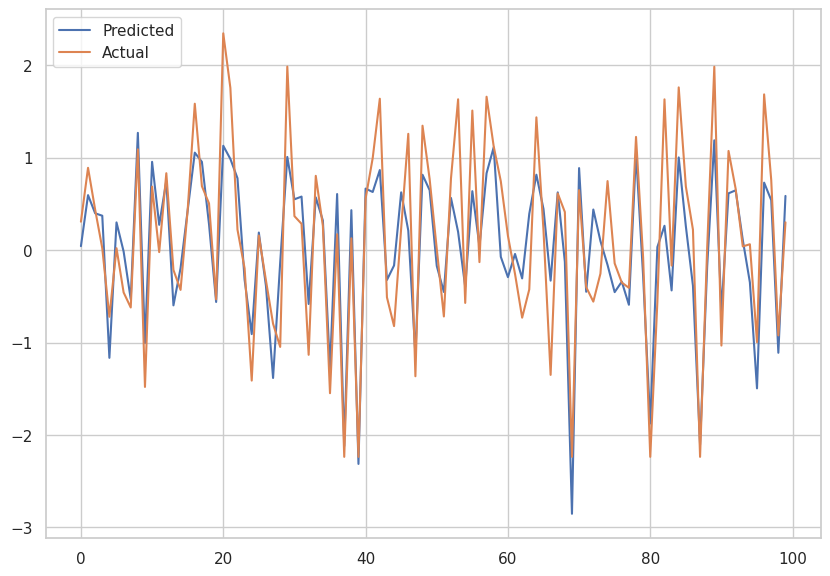

In [ ]:
# calling train_linear_model to train,fit and evalution of elasticnet model
train_linear_model(elastic_grid,X_train,y_train,X_test,y_test)

# Polynomial Regression


In [ ]:
#creating pipeline to convert x to polynomial feature and apply Linear Regression

from sklearn.pipeline import make_pipeline
#importing polynomial features
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
pipe=make_pipeline(PolynomialFeatures(degree=2),LinearRegression())


================Evalution Matrix=========================

MSE : 0.5172362381404242
RMSE : 0.7191913779658542
R2 : 0.6494140064852105
Adjusted R2 :  0.6445419370906795

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



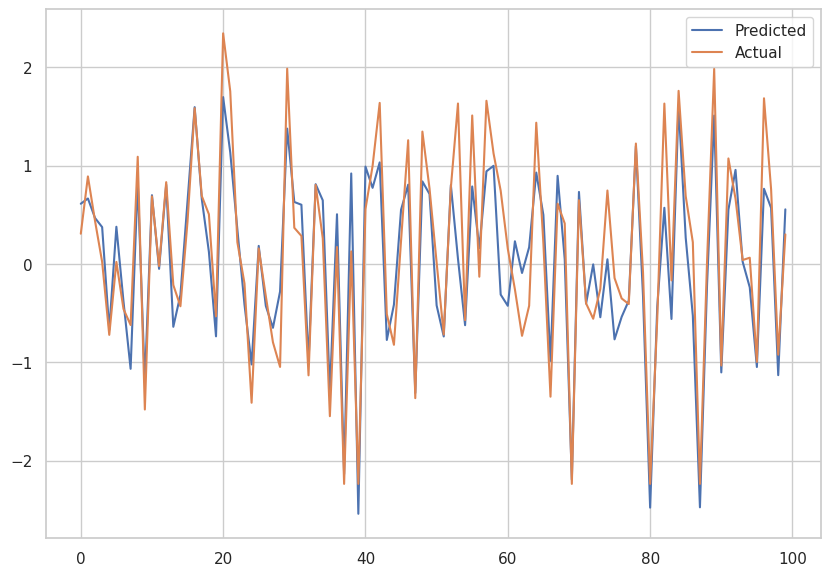

In [ ]:
# calling train_linear_model to train,fit and evalution of polynomial model
train_linear_model(pipe,X_train,y_train,X_test,y_test)

# polinomial regession with degree 3

In [ ]:
pipe_3=make_pipeline(PolynomialFeatures(degree=3),LinearRegression())


================Evalution Matrix=========================

MSE : 6.649820887538891e+33
RMSE : 8.154643393514453e+16
R2 : -4.50729065491403e+33
Adjusted R2 :  -4.569928162567728e+33

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



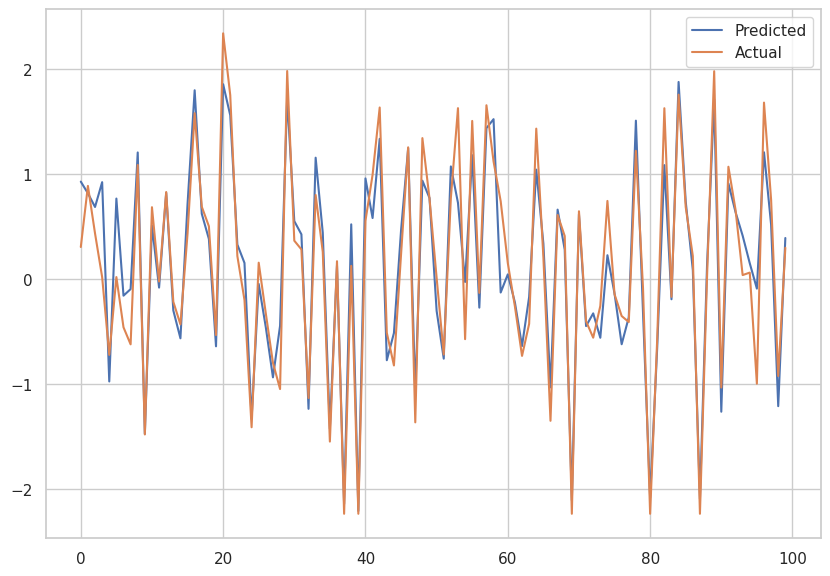

In [ ]:
# calling train_linear_model to train,fit and evalution of polynomial model
train_linear_model(pipe_3,X_train,y_train,X_test,y_test)

# Decision Tree Regression

In [ ]:
from sklearn.tree import DecisionTreeRegressor


================Evalution Matrix=========================

MSE : 0.3938849963310792
RMSE : 0.627602578333677
R2 : 0.7330222583286778
Adjusted R2 :  0.7293120870489374

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



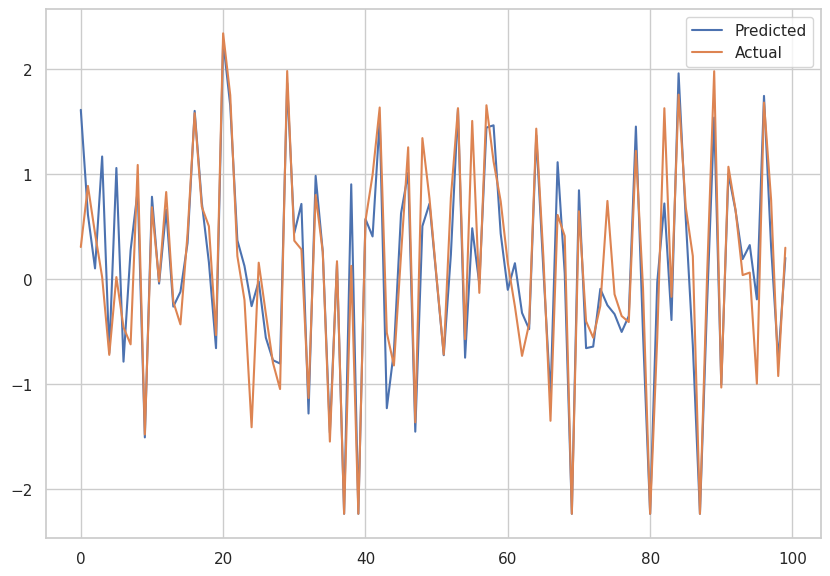

In [ ]:
#creating decision tree model
dt_model = DecisionTreeRegressor()
#calling run_model to train,fit and evalution of decision tree model
train_linear_model(dt_model,X_train,y_train,X_test,y_test)

In [ ]:
def get_features_importance (optimal_model,X_train):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,10))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()


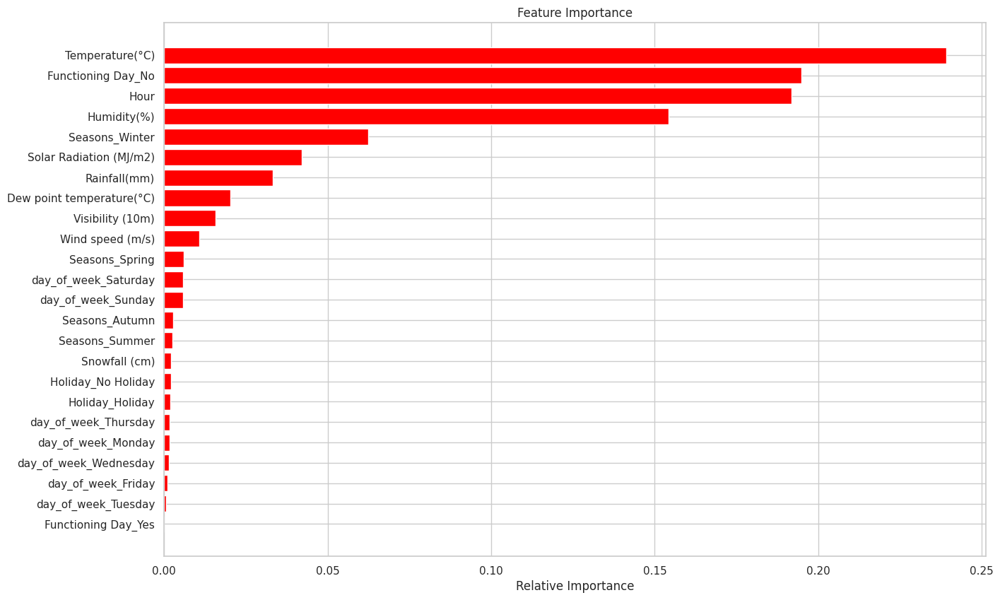

In [ ]:
#getting features importance of decision tree
get_features_importance(dt_model,X_train)

# Random forest

In [ ]:
#importing Random forest
from sklearn.ensemble import RandomForestRegressor

In [ ]:
#creating model of random forest
rf_model = RandomForestRegressor()

In [ ]:
#creating param dict to check random forest with diffirent value of parameter through gridsearch
n_estimators=[60,80,100]
max_depth=[15,20]
max_leaf_nodes=[40,60,80]
params = {'n_estimators':n_estimators,'max_depth':max_depth ,'max_leaf_nodes':max_leaf_nodes}

In [ ]:
#creating rf_grid model to run rf model with gridsearch
rf_grid= GridSearchCV(rf_model,param_grid=params,verbose=0)


================Evalution Matrix=========================

MSE : 0.3256472649722303
RMSE : 0.5706551191150661
R2 : 0.7792742242188606
Adjusted R2 :  0.7762068133220759

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



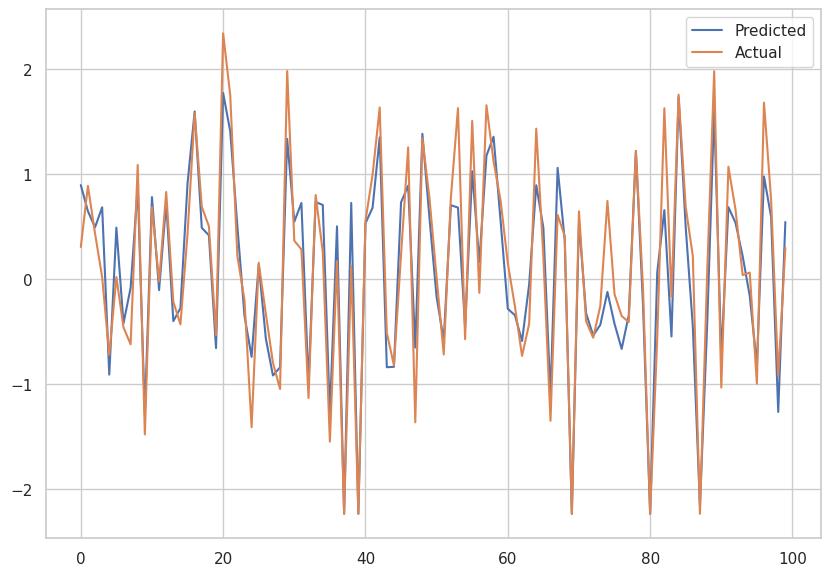

In [ ]:
#calling run_model to train,fit and evalution of decision tree model
train_linear_model(rf_grid,X_train,y_train,X_test,y_test)

# Gradient boosting

In [ ]:
#importing Gradient Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
#creating model of Gradient Boosting
gb_model=GradientBoostingRegressor()

In [ ]:
# creating param dict to check diffirent value of parameter
n_estimators=[80,100,150]
max_depth=[15,20,30]

params = {'n_estimators':n_estimators,'max_depth':max_depth }

In [ ]:
#grid search for gradient bossting
gb_grid= GridSearchCV(gb_model,param_grid=params,verbose=0)


================Evalution Matrix=========================

MSE : 0.23884010572122766
RMSE : 0.4887127026395238
R2 : 0.8381126657782221
Adjusted R2 :  0.8358629286494886

================Evalution Matrix=========================

  =========================================================  Evalution Graph  ===================================================



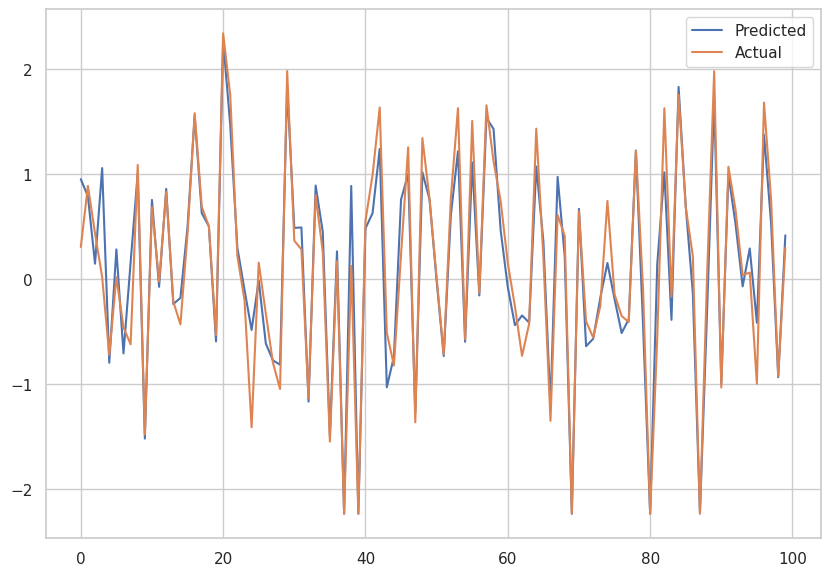

In [ ]:
#calling run_model to train,fit and evalution of gradient boosting model
train_linear_model(gb_grid,X_train,y_train,X_test,y_test)

# eXtreme Gradient Boosting

In [ ]:
#importing XGBoost Regressor
from xgboost import XGBRegressor

In [ ]:
 #creating Xgboost model
xgb_model=XGBRegressor()

In [ ]:
#creating param dict for gridsearch
n_estimators=[80,100,150]
max_depth=[15,20,30]


params = {'n_estimators':n_estimators,'max_depth':max_depth }

In [ ]:
#creating xgb grid model
xgb_grid= GridSearchCV(xgb_model,param_grid=params,verbose=0)

[04:09:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:09:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

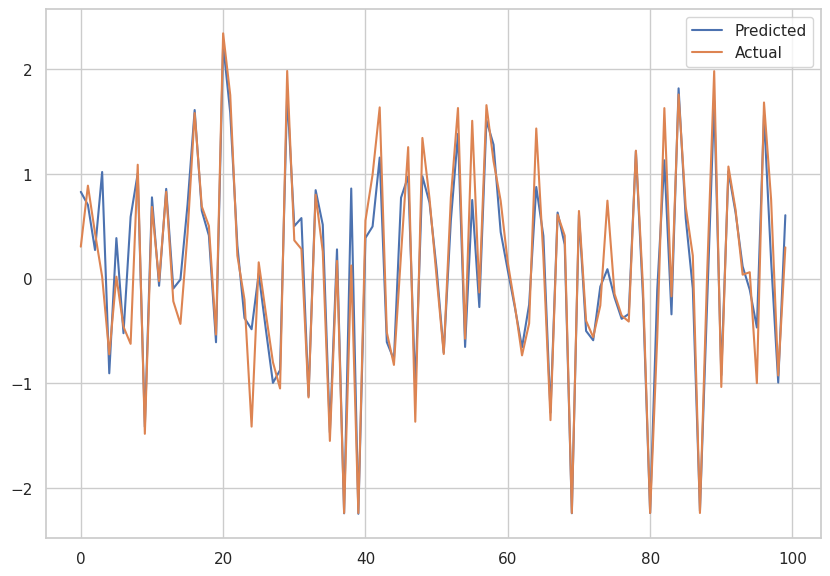

In [ ]:
#calling run_model to train,fit and evalution of xgb_grid model
train_linear_model(xgb_grid,X_train,y_train,X_test,y_test);

# Combined Evaluation Matrix of All the models

In [ ]:
#creating dictionary to store all the metrices 
all_model_matrices={'Mean_square_error':mean_sq_error,'Root_Mean_square_error':root_mean_sq_error,'R2':r2_list,'Adjusted_R2':adj_r2_list}

In [ ]:
all_model_matrices

{'Mean_square_error': [1.076126943011156,
  1.0757081296209068,
  1.0750024132133889,
  1.0755311517134152,
  0.5172362381404242,
  6.649820887538891e+33,
  0.3938849963310792,
  0.3256472649722303,
  0.23884010572122766,
  0.21646689301638986],
 'Root_Mean_square_error': [1.0373653854891998,
  1.0371635018746594,
  1.036823231420568,
  1.0370781801356228,
  0.7191913779658542,
  8.154643393514453e+16,
  0.627602578333677,
  0.5706551191150661,
  0.4887127026395238,
  0.4652600273141782],
 'R2': [0.2705943519735111,
  0.2708782263382419,
  0.2713565653826191,
  0.2709981830832511,
  0.6494140064852105,
  -4.50729065491403e+33,
  0.7330222583286778,
  0.7792742242188606,
  0.8381126657782221,
  0.8532773708507885],
 'Adjusted_R2': [0.26045785194303306,
  0.26074567129024995,
  0.2612306577793666,
  0.2608672950658788,
  0.6445419370906795,
  -4.569928162567728e+33,
  0.7293120870489374,
  0.7762068133220759,
  0.8358629286494886,
  0.8512383765835152]}

In [ ]:
#list of all model made 
model_name=['Linear','Lasso','Ridge','Elasticnet','Polynomial_degree-2','Polynomial_degree_3','Decision_Tree','Random_Forest','Gradient_Boosting','Xtreme_GB']

In [ ]:
#converting dictionary to dataframe from easy visual
matrices_df=pd.DataFrame.from_dict(all_model_matrices,orient="index",columns=model_name)

In [ ]:
matrices_df

,Linear,Lasso,Ridge,Elasticnet,Polynomial_degree-2,Polynomial_degree_3,Decision_Tree,Random_Forest,Gradient_Boosting,Xtreme_GB
Mean_square_error,1.076127,1.075708,1.075002,1.075531,0.517236,6.649821e+33,0.393885,0.325647,0.238840,0.216467
Root_Mean_square_error,1.037365,1.037164,1.036823,1.037078,0.719191,8.154643e+16,0.627603,0.570655,0.488713,0.465260
R2,0.270594,0.270878,0.271357,0.270998,0.649414,-4.507291e+33,0.733022,0.779274,0.838113,0.853277
Adjusted_R2,0.260458,0.260746,0.261231,0.260867,0.644542,-4.569928e+33,0.729312,0.776207,0.835863,0.851238


In [ ]:
final_matrices=matrices_df.transpose().reset_index().rename(columns={'index':'Models'})
final_matrices

,Models,Mean_square_error,Root_Mean_square_error,R2,Adjusted_R2
0,Linear,1.076127e+00,1.037365e+00,2.705944e-01,2.604579e-01
1,Lasso,1.075708e+00,1.037164e+00,2.708782e-01,2.607457e-01
2,Ridge,1.075002e+00,1.036823e+00,2.713566e-01,2.612307e-01
3,Elasticnet,1.075531e+00,1.037078e+00,2.709982e-01,2.608673e-01
4,Polynomial_degree-2,5.172362e-01,7.191914e-01,6.494140e-01,6.445419e-01
5,Polynomial_degree_3,6.649821e+33,8.154643e+16,-4.507291e+33,-4.569928e+33
6,Decision_Tree,3.938850e-01,6.276026e-01,7.330223e-01,7.293121e-01
7,Random_Forest,3.256473e-01,5.706551e-01,7.792742e-01,7.762068e-01
8,Gradient_Boosting,2.388401e-01,4.887127e-01,8.381127e-01,8.358629e-01
9,Xtreme_GB,2.164669e-01,4.652600e-01,8.532774e-01,8.512384e-01


In [ ]:
# Final Checking all Results
pd.options.display.float_format = '{:.2f}'.format
matrices_df.T.round(decimals=3)

,Mean_square_error,Root_Mean_square_error,R2,Adjusted_R2
Linear,1.08,1.04,0.27,0.26
Lasso,1.08,1.04,0.27,0.26
Ridge,1.07,1.04,0.27,0.26
Elasticnet,1.08,1.04,0.27,0.26
Polynomial_degree-2,0.52,0.72,0.65,0.65
Polynomial_degree_3,6649820887538891338565306911031296.00,81546433935144528.00,-4507290654914029748576156448194560.00,-4569928162567727833308414131306496.00
Decision_Tree,0.39,0.63,0.73,0.73
Random_Forest,0.33,0.57,0.78,0.78
Gradient_Boosting,0.24,0.49,0.84,0.84
Xtreme_GB,0.22,0.47,0.85,0.85


# Conclusion

With this we have completed our experiments of using different models and evaluating those models with help of different evaluation matrices. We have started from EDA, Normalisation, Checking correlation, One hot encoding, then applying various models like Linear Regression, Lasso Regression, Ridge Regression,  Elastic Net Regression, Polynomial Regression, Decision Tree, Random Forest, Gradient Boosting and eXtreme Gradient Boosting. After that we have evaluate all those model using different evaluation matrices and we found that Xgboost  model giving us best result of R2 and Adjusted R2. 